In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import rasterio
import os

# Viewing Original Files
The first thing I did was view the provided files in matplotlib. 

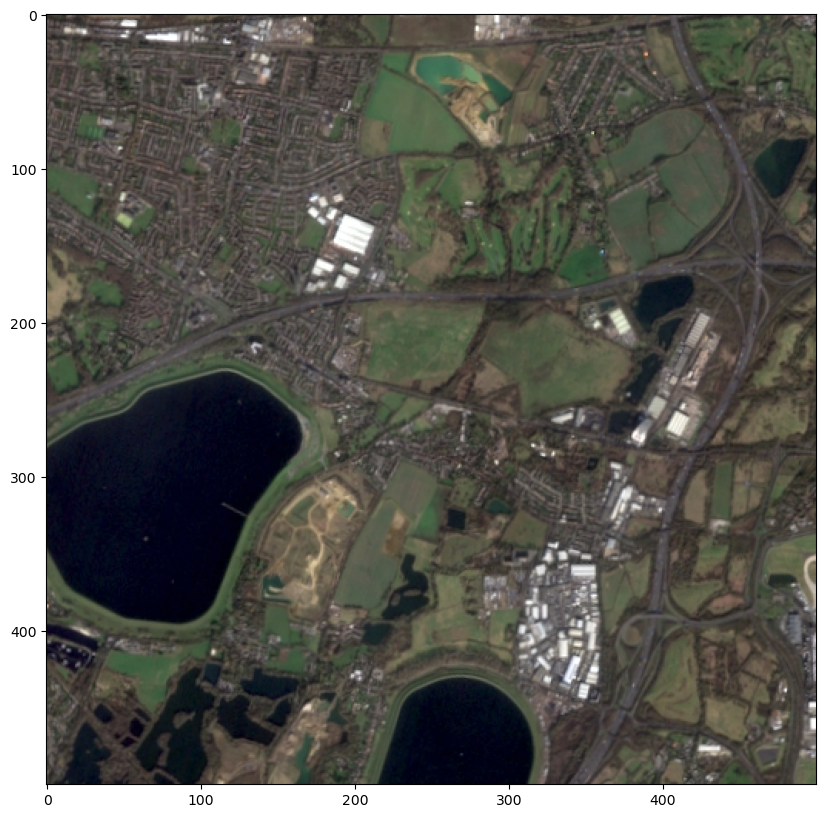

In [70]:
# Read the image using OpenCV
img = cv2.imread("../data/20230215-SE2B-CGG-GBR-MS3-L3-RGB-preview.jpg", cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Render the image using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(img)

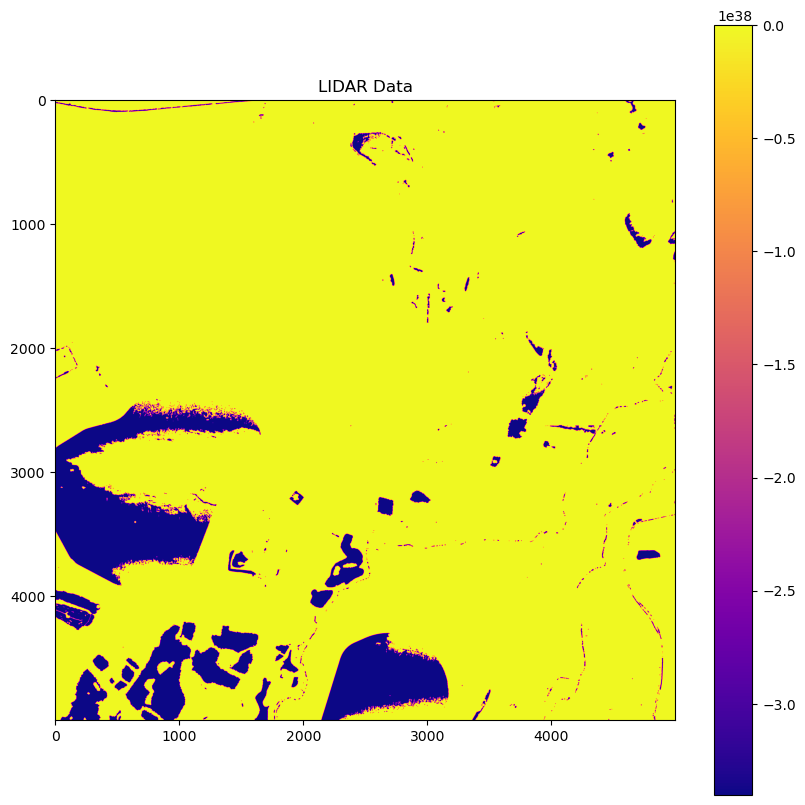

In [72]:
# Open the LIDAR data using rasterio
with rasterio.open("../data/DSM_TQ0075_P_12757_20230109_20230315.tif") as lidar:
    lidar_data = lidar.read(1)

# Plot the LIDAR data using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(lidar_data, cmap='plasma')
plt.colorbar()
plt.title('LIDAR Data')
plt.show()


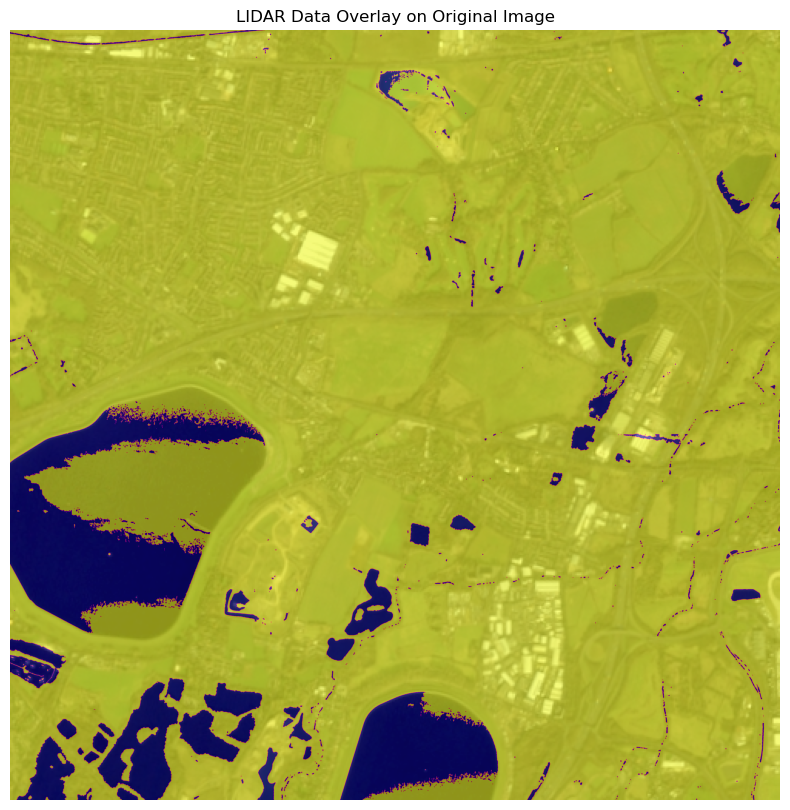

In [4]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the LIDAR data with transparency
ax.imshow(lidar_data, cmap='plasma', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

The LIDAR data is very difficult to discern any detail from like this. This is because there is such a difference in height between the land and the bottom of the lakes that the differences between the top of a small building are barely distinguishable from the ground.

In an attempt to fix this I tried setting a minimum threshold height, which would ensure only points above a certain height were displayed. This works largely, but in order to include houses it also includes large shallow portions of the lake

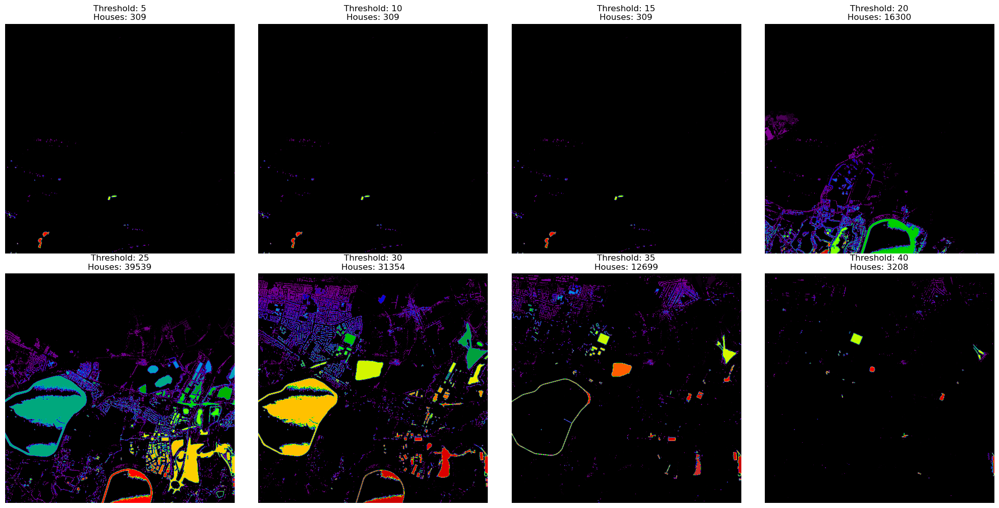

In [5]:
threshold_values = [5 * n for n in range(1, 10)]
fig, axes = plt.subplots(2, len(threshold_values) // 2, figsize=(20, 10))

for ax, threshold in zip(axes.flatten(), threshold_values):
    house_regions = lidar_data > threshold
    num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))
    
    ax.imshow(labels_im, cmap='nipy_spectral')
    ax.set_title(f'Threshold: {threshold}\nHouses: {num_labels - 1}')
    ax.axis('off')

plt.tight_layout()
plt.show()


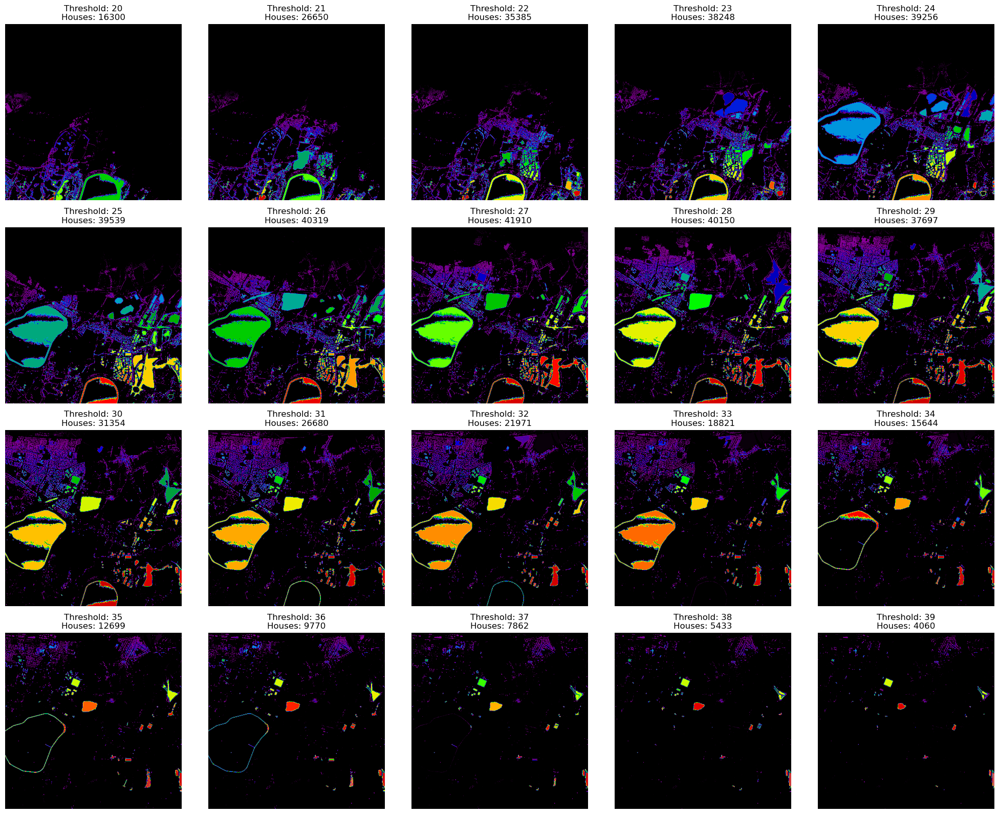

In [6]:
threshold_values = list(range(20, 40))
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for ax, threshold in zip(axes.flatten(), threshold_values):
    house_regions = lidar_data > threshold
    num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))
    
    ax.imshow(labels_im, cmap='nipy_spectral')
    ax.set_title(f'Threshold: {threshold}\nHouses: {num_labels - 1}')
    ax.axis('off')

plt.tight_layout()
plt.show()


By removing large connected components I could remove stuff like the lake and the field, but many of the buildings were missing

In [ ]:
min_size = 25  # Minimum size of objects to be considered as houses
max_size = 1500  # Maximum size of objects to be considered as houses

threshold = 30
house_regions = lidar_data > threshold
num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))

# Filter out excessively large objects
filtered_labels_im = np.zeros_like(labels_im)
for label in range(1, num_labels):
    label_mask = labels_im == label
    label_size = np.sum(label_mask)
    if min_size <= label_size <= max_size:
        filtered_labels_im[label_mask] = label

fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Plot the original image
axes[0].imshow(img)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Plot the filtered LIDAR data
axes[1].imshow(filtered_labels_im, cmap='nipy_spectral')
axes[1].set_title(f'Filtered LIDAR Data\nThreshold: {threshold}\nHouses: {np.max(filtered_labels_im)}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

I felt that `threshold = 30` was the best result of these as far as preserving the highest number of buildings, particularly in the top left. Many of the buildings in the bottom right were missing however. This was due to a difference in elevation between these two places. By cutting all points below the 30 height plane I was removing many of the buildings on a lower elevation 

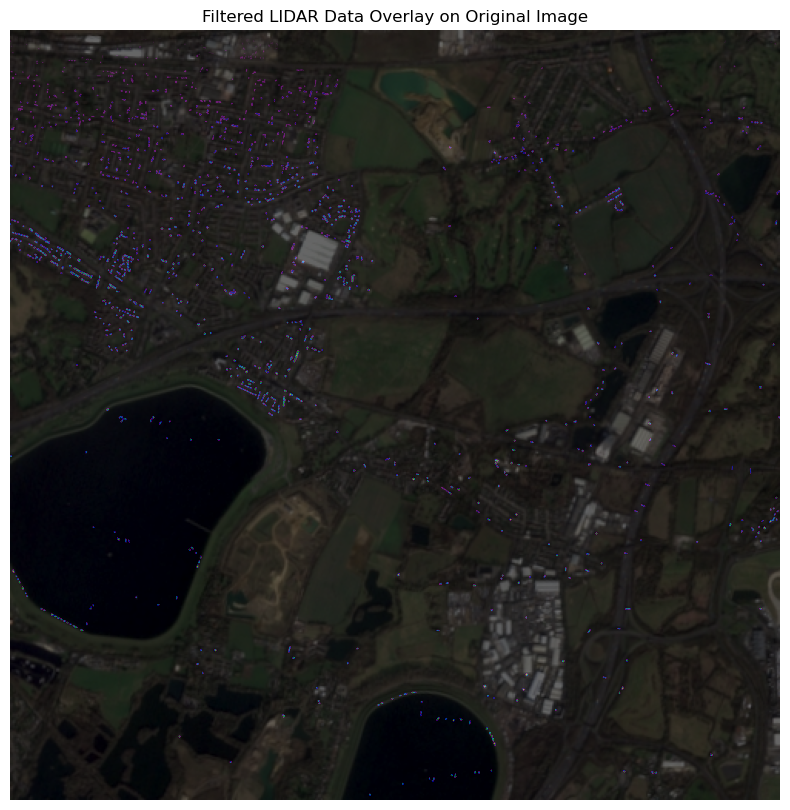

In [81]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the filtered LIDAR data with transparency
ax.imshow(filtered_labels_im, cmap='nipy_spectral', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Filtered LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

I tried normalising to remove the extreme depths, trying many different thresholds.

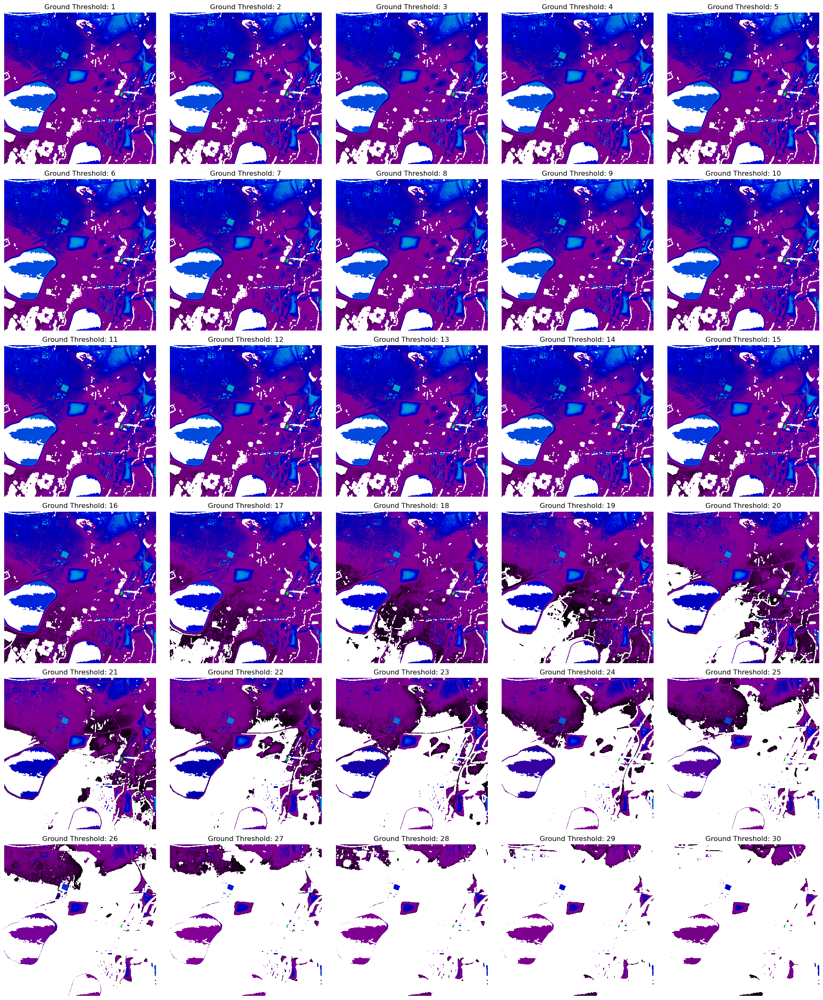

In [82]:
fig, axes = plt.subplots(6, 5, figsize=(20, 24))

for ax, ground_threshold in zip(axes.flatten(), range(1, 31)):
    # Create a mask for areas above the ground
    above_ground_mask = lidar_data > ground_threshold

    # Apply the mask to the LIDAR data
    above_ground_lidar_data = np.where(above_ground_mask, lidar_data, np.nan)

    # Plot the filtered LIDAR data
    ax.imshow(above_ground_lidar_data, cmap='nipy_spectral')
    ax.set_title(f'Ground Threshold: {ground_threshold}')
    ax.axis('off')

plt.tight_layout()
plt.show()

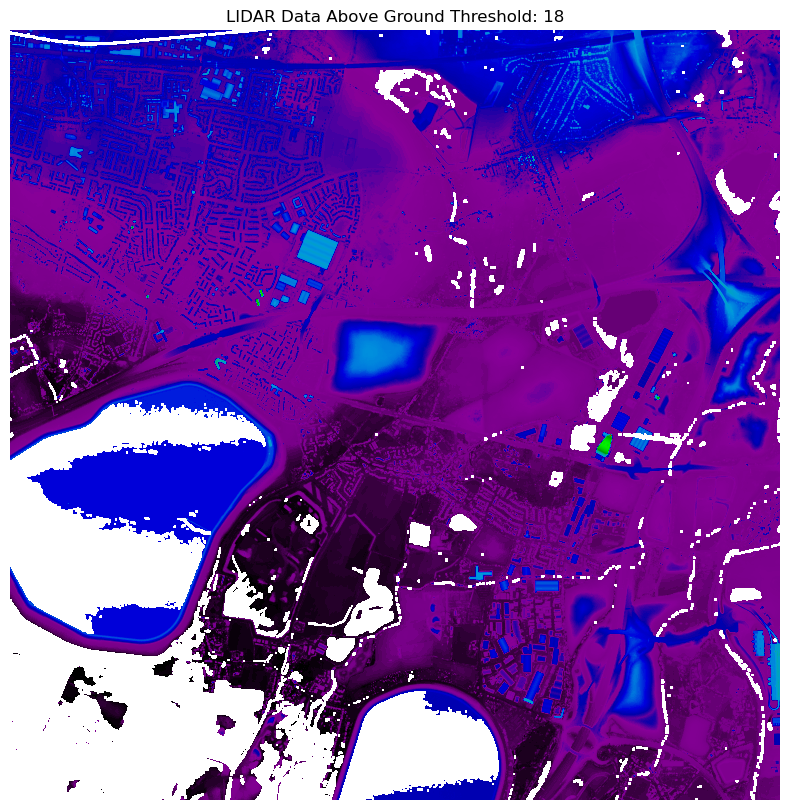

In [83]:
ground_threshold = 18

# Create a mask for areas above the ground threshold
above_ground_mask = lidar_data > ground_threshold

# Apply the mask to the LIDAR data
above_ground_lidar_data = np.where(above_ground_mask, lidar_data, np.nan)

# Plot the filtered LIDAR data
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(above_ground_lidar_data, cmap='nipy_spectral')
ax.set_title(f'LIDAR Data Above Ground Threshold: {ground_threshold}')
ax.axis('off')

plt.show()

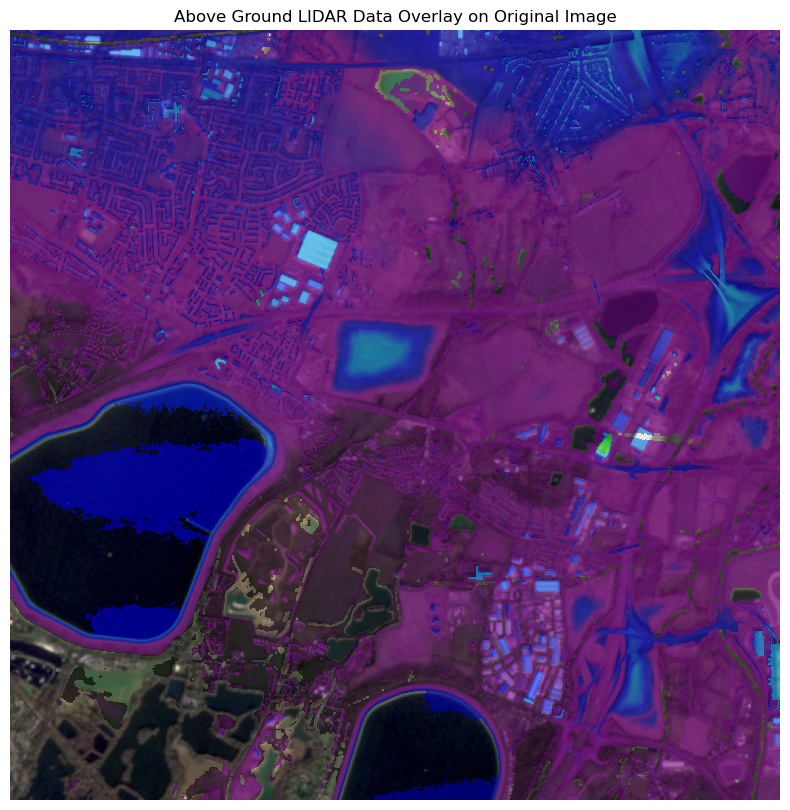

In [84]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the above ground LIDAR data with transparency
ax.imshow(above_ground_lidar_data, cmap='nipy_spectral', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Above Ground LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()


In [85]:
# Read the NRG image using OpenCV
nrg_img = cv2.imread("../data/20230215-SE2B-CGG-GBR-MS3-L3-NRG-preview.jpg", cv2.IMREAD_COLOR)

# Split the NRG image into its respective bands
nir_band = nrg_img[:, :, 0].astype(float)  # Near-Infrared band
red_band = nrg_img[:, :, 2].astype(float)  # Red band

# Subtract the bands
band_difference = nir_band - red_band

# Plot the band difference



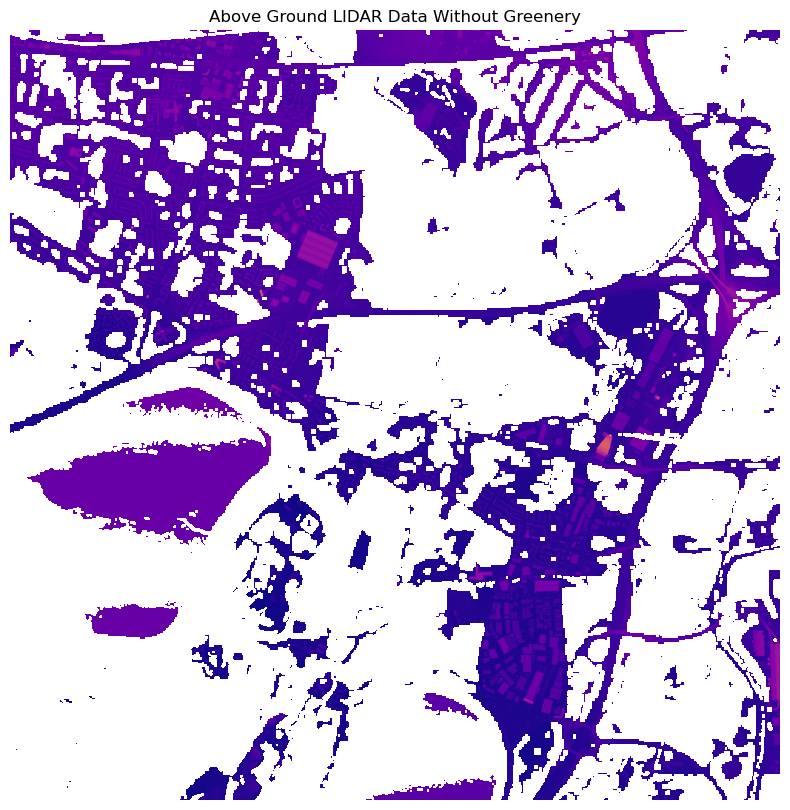

In [86]:
# Define a threshold for the band difference to identify greenery
greenery_threshold = -50

# Create a mask for areas that are not greenery
non_greenery_mask = band_difference > greenery_threshold

# Resize the mask to match the shape of above_ground_lidar_data
non_greenery_mask_resized = cv2.resize(non_greenery_mask.astype(np.uint8), (above_ground_lidar_data.shape[1], above_ground_lidar_data.shape[0]), interpolation=cv2.INTER_NEAREST).astype(bool)

# Apply the resized mask to the above ground LIDAR data
above_ground_lidar_data_no_greenery = np.where(non_greenery_mask_resized, above_ground_lidar_data, np.nan)

# Plot the filtered LIDAR data without greenery
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(above_ground_lidar_data_no_greenery, cmap='plasma')
ax.set_title('Above Ground LIDAR Data Without Greenery')
ax.axis('off')

plt.show()

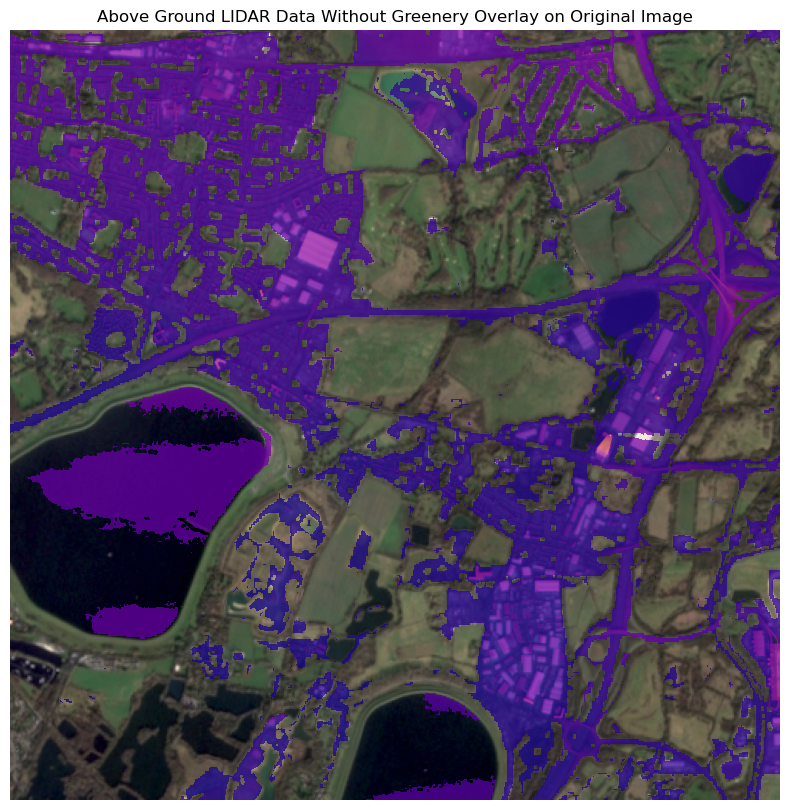

In [87]:
# Plot the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the filtered LIDAR data without greenery with transparency
ax.imshow(above_ground_lidar_data_no_greenery, cmap='plasma', alpha=0.75, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Above Ground LIDAR Data Without Greenery Overlay on Original Image')
ax.axis('off')

plt.show()

In [88]:
min_size = 25  # Minimum size of objects to be considered as houses
max_size = 100  # Maximum size of objects to be considered as houses

threshold = 30
house_regions = above_ground_lidar_data_no_greenery > threshold
num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))

# Filter out excessively large objects
filtered_labels_im = np.zeros_like(labels_im)
for label in range(1, num_labels):
    label_mask = labels_im == label
    label_size = np.sum(label_mask)
    if min_size <= label_size <= max_size:
        filtered_labels_im[label_mask] = label

fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Plot the original image
axes[0].imshow(img)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Plot the filtered LIDAR data
axes[1].imshow(filtered_labels_im, cmap='nipy_spectral')
axes[1].set_title(f'Filtered LIDAR Data\nThreshold: {threshold}\nHouses: {np.max(filtered_labels_im)}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

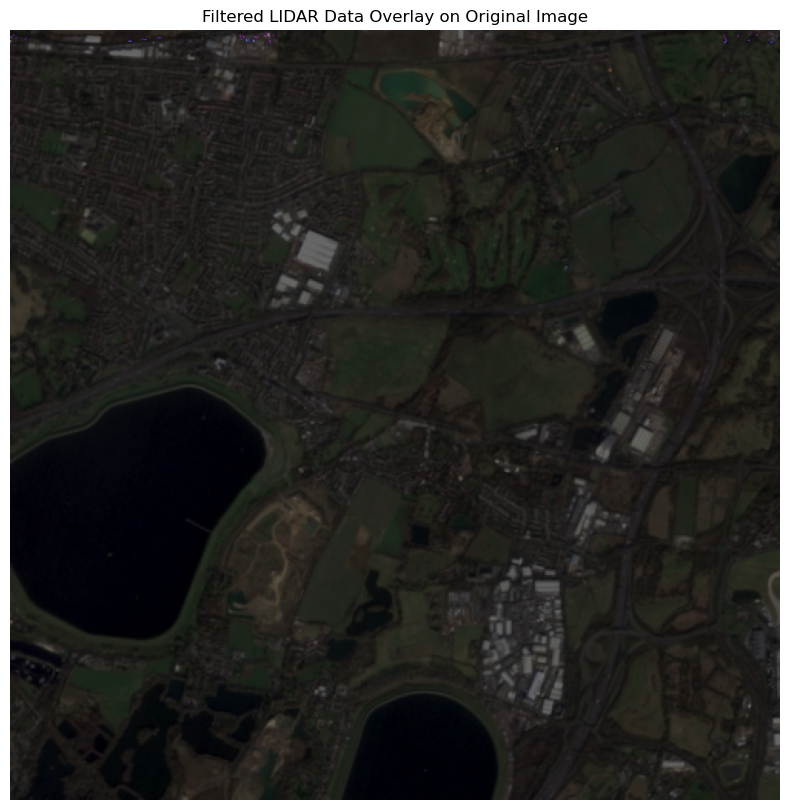

In [89]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the filtered LIDAR data with transparency
ax.imshow(filtered_labels_im, cmap='nipy_spectral', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Filtered LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

/tmp/ipykernel_209923/1738296863.py:2: RuntimeWarning: invalid value encountered in log
  log_lidar_data = np.log(lidar_data)


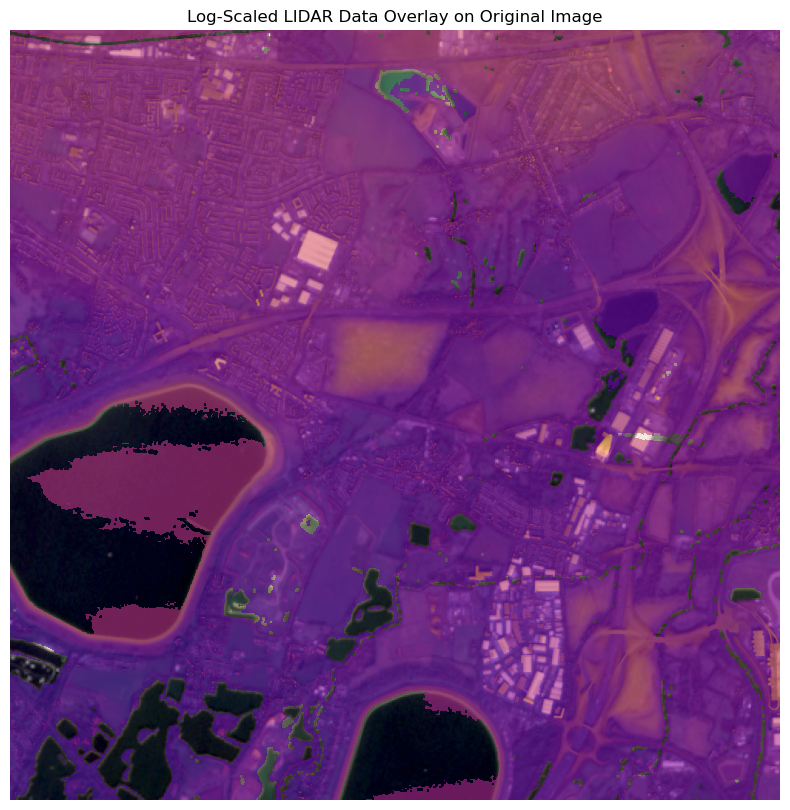

In [90]:
# Convert LIDAR data to log scale
log_lidar_data = np.log(lidar_data)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the log-scaled LIDAR data with transparency
ax.imshow(log_lidar_data, cmap='plasma', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Log-Scaled LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

/tmp/ipykernel_209923/1120273395.py:2: RuntimeWarning: invalid value encountered in log2
  log_lidar_data = np.log2(lidar_data)


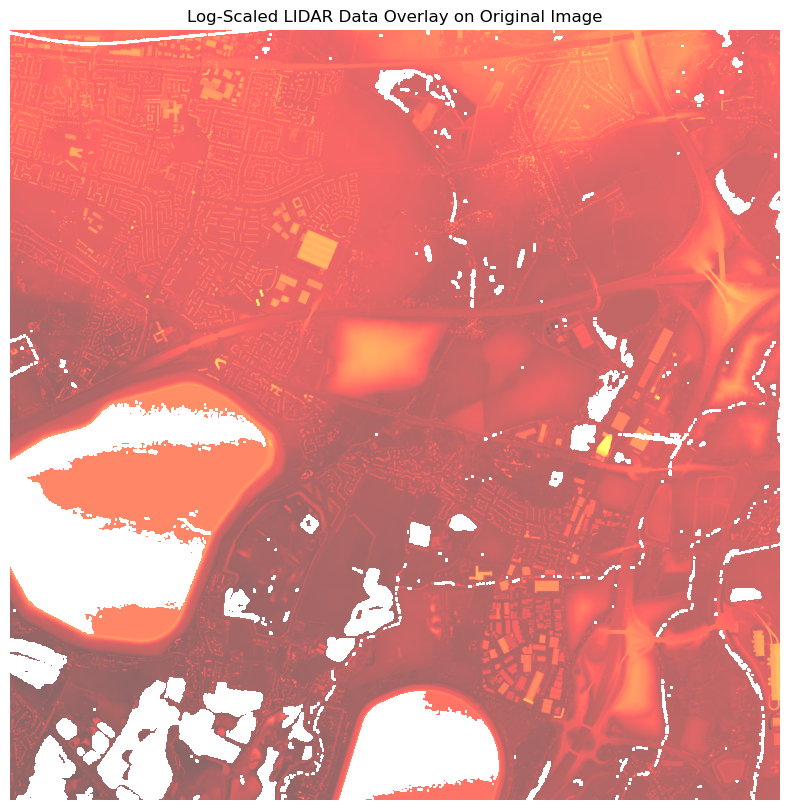

In [91]:
# Convert LIDAR data to log scale
log_lidar_data = np.log2(lidar_data)

fig, ax = plt.subplots(figsize=(10, 10))

# Overlay the log-scaled LIDAR data with transparency
ax.imshow(log_lidar_data, cmap='hot', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Log-Scaled LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

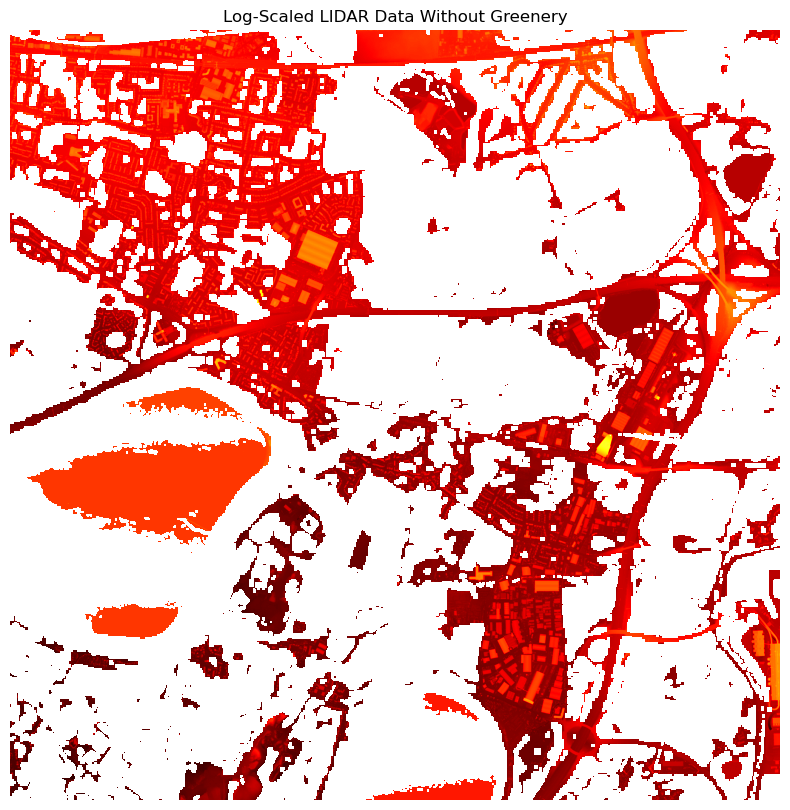

In [92]:
# Apply the resized mask to the log-scaled LIDAR data
log_lidar_data_no_greenery = np.where(non_greenery_mask_resized, log_lidar_data, np.nan)

# Plot the filtered log-scaled LIDAR data without greenery
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(log_lidar_data_no_greenery, cmap='hot')
ax.set_title('Log-Scaled LIDAR Data Without Greenery')
ax.axis('off')

plt.show()

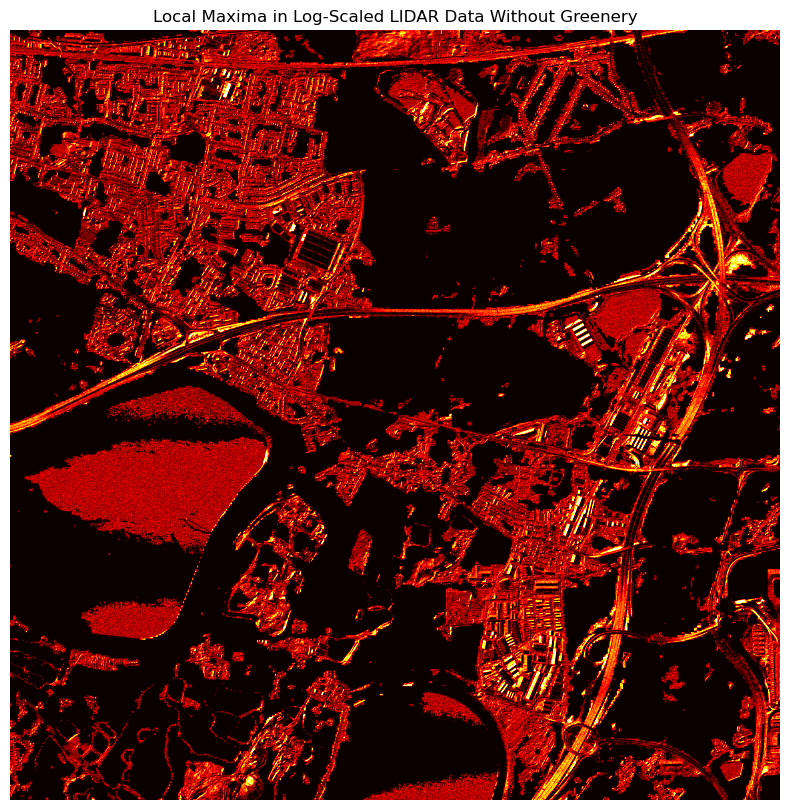

In [93]:
from scipy.ndimage import maximum_filter

# Define the neighborhood size for local maxima detection
neighborhood_size = 2

# Apply the maximum filter to find local maxima
local_max = (log_lidar_data_no_greenery == maximum_filter(log_lidar_data_no_greenery, footprint=np.ones((neighborhood_size, neighborhood_size))))

# Plot the local maxima
fig, ax = plt.subplots(figsize=(10, 10))

# Overlay the local maxima on the log-scaled LIDAR data without greenery
ax.imshow(local_max, cmap='hot', alpha=1, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Local Maxima in Log-Scaled LIDAR Data Without Greenery')
ax.axis('off')

plt.show()

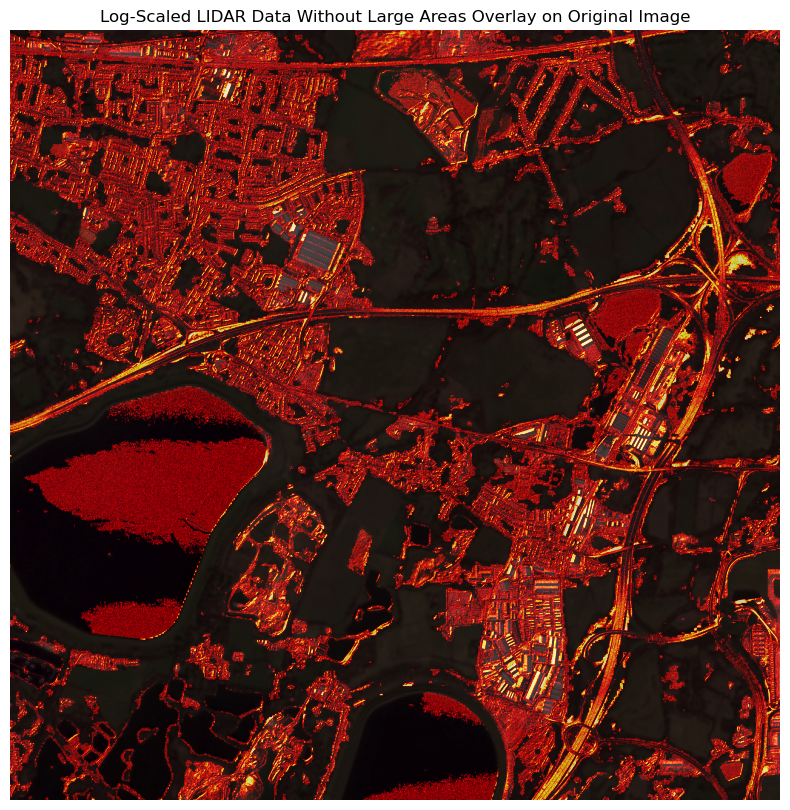

In [ ]:
# Define a threshold for the band difference to identify large areas
large_area_threshold = 1000  # Adjust this value as needed

# Create a mask for large areas in the band difference image
large_area_mask = band_difference > large_area_threshold

# Perform connected component analysis on the large area mask
num_labels, labels_im = cv2.connectedComponents(large_area_mask.astype(np.uint8))

# Filter out large areas from the log_lidar_data_no_greenery data
filtered_local_max = local_max.copy()
for label in range(1, num_labels):
    label_mask = labels_im == label
    label_size = np.sum(label_mask)
    if label_size > large_area_threshold:
        filtered_local_max[label_mask] = np.nan

# Plot the filtered log-scaled LIDAR data without large areas on the original image
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the filtered log-scaled LIDAR data without large areas with transparency
ax.imshow(filtered_local_max, cmap='hot', alpha=0.75, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Log-Scaled LIDAR Data Without Large Areas Overlay on Original Image')
ax.axis('off')

plt.show()